In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import pickle
from rdp import rdp

In [6]:
data = pd.read_csv(r'C:\competition\www\data_processed.csv')

In [3]:
data

,Unnamed: 0,vid,daq_time,status,c_stat,soc,lng,lat,pdate,time,to_datetime,time_diff,soc_shift_1,codes,code_shift,time_diff_shift,soc_shift_-1,soc_diff
0,0,0000569a867e4893bb57fbed89464483,20191001174551,1.0,3.0,100.0,NaN,NaN,2019-10-01,2019-10-01 17:45:51,2019-10-01 17:45:51,-1.0,NaN,0,NaN,3820.0,80.0,-20.0
1,1,0000569a867e4893bb57fbed89464483,20191001184931,2.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:49:31,2019-10-01 18:49:31,3820.0,100.0,0,0.0,572.0,80.0,0.0
2,2,0000569a867e4893bb57fbed89464483,20191001185903,1.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:59:03,2019-10-01 18:59:03,572.0,80.0,0,0.0,45750.0,79.0,-1.0
3,3,0000569a867e4893bb57fbed89464483,20191002074133,2.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:41:33,2019-10-02 07:41:33,45750.0,80.0,0,0.0,50.0,79.0,0.0
4,4,0000569a867e4893bb57fbed89464483,20191002074223,1.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:42:23,2019-10-02 07:42:23,50.0,79.0,0,0.0,20.0,79.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3132018,3132018,02d2a254a0044667bbd0c3601e1be035,20191231235556,2.0,1.0,30.0,116297289.0,38961176.0,2019-12-31,2019-12-31 23:55:56,2019-12-31 23:55:56,10.0,30.0,86,86.0,10.0,30.0,0.0
3132019,3132019,02d2a254a0044667bbd0c3601e1be035,20191231235606,2.0,1.0,30.0,116297278.0,38961141.0,2019-12-31,2019-12-31 23:56:06,2019-12-31 23:56:06,10.0,30.0,86,86.0,10.0,30.0,0.0
3132020,3132020,02d2a254a0044667bbd0c3601e1be035,20191231235616,2.0,1.0,30.0,116297265.0,38961092.0,2019-12-31,2019-12-31 23:56:16,2019-12-31 23:56:16,10.0,30.0,86,86.0,10.0,30.0,0.0
3132021,3132021,02d2a254a0044667bbd0c3601e1be035,20191231235626,2.0,1.0,30.0,116297228.0,38961037.0,2019-12-31,2019-12-31 23:56:26,2019-12-31 23:56:26,10.0,30.0,86,86.0,10.0,30.0,0.0


In [7]:
data = data.drop(['Unnamed: 0','daq_time','pdate'], axis=1)
data

,vid,status,c_stat,soc,lng,lat,time,to_datetime,time_diff,soc_shift_1,codes,code_shift,time_diff_shift,soc_shift_-1,soc_diff
0,0000569a867e4893bb57fbed89464483,1.0,3.0,100.0,NaN,NaN,2019-10-01 17:45:51,2019-10-01 17:45:51,-1.0,NaN,0,NaN,3820.0,80.0,-20.0
1,0000569a867e4893bb57fbed89464483,2.0,3.0,80.0,NaN,NaN,2019-10-01 18:49:31,2019-10-01 18:49:31,3820.0,100.0,0,0.0,572.0,80.0,0.0
2,0000569a867e4893bb57fbed89464483,1.0,3.0,80.0,NaN,NaN,2019-10-01 18:59:03,2019-10-01 18:59:03,572.0,80.0,0,0.0,45750.0,79.0,-1.0
3,0000569a867e4893bb57fbed89464483,2.0,3.0,79.0,NaN,NaN,2019-10-02 07:41:33,2019-10-02 07:41:33,45750.0,80.0,0,0.0,50.0,79.0,0.0
4,0000569a867e4893bb57fbed89464483,1.0,3.0,79.0,NaN,NaN,2019-10-02 07:42:23,2019-10-02 07:42:23,50.0,79.0,0,0.0,20.0,79.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3132018,02d2a254a0044667bbd0c3601e1be035,2.0,1.0,30.0,116297289.0,38961176.0,2019-12-31 23:55:56,2019-12-31 23:55:56,10.0,30.0,86,86.0,10.0,30.0,0.0
3132019,02d2a254a0044667bbd0c3601e1be035,2.0,1.0,30.0,116297278.0,38961141.0,2019-12-31 23:56:06,2019-12-31 23:56:06,10.0,30.0,86,86.0,10.0,30.0,0.0
3132020,02d2a254a0044667bbd0c3601e1be035,2.0,1.0,30.0,116297265.0,38961092.0,2019-12-31 23:56:16,2019-12-31 23:56:16,10.0,30.0,86,86.0,10.0,30.0,0.0
3132021,02d2a254a0044667bbd0c3601e1be035,2.0,1.0,30.0,116297228.0,38961037.0,2019-12-31 23:56:26,2019-12-31 23:56:26,10.0,30.0,86,86.0,10.0,30.0,0.0


In [8]:
data_driving = data[data['status']==1]
data_driving = data_driving.fillna(0)
data_driving = data_driving[(data_driving['lng']!=0) & (data_driving['lat']!=0)].reset_index(drop=True)

In [9]:
data_driving

,vid,status,c_stat,soc,lng,lat,time,to_datetime,time_diff,soc_shift_1,codes,code_shift,time_diff_shift,soc_shift_-1,soc_diff
0,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116348615.0,39966315.0,2019-10-24 18:11:28,2019-10-24 18:11:28,2222.0,100.0,0,0.0,10.0,92.0,0.0
1,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349033.0,39966312.0,2019-10-24 18:11:38,2019-10-24 18:11:38,10.0,92.0,0,0.0,10.0,92.0,0.0
2,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349469.0,39966316.0,2019-10-24 18:11:48,2019-10-24 18:11:48,10.0,92.0,0,0.0,10.0,92.0,0.0
3,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349848.0,39966317.0,2019-10-24 18:11:58,2019-10-24 18:11:58,10.0,92.0,0,0.0,10.0,92.0,0.0
4,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116350488.0,39966324.0,2019-10-24 18:12:08,2019-10-24 18:12:08,10.0,92.0,0,0.0,10.0,92.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1203927,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116298660.0,38959231.0,2019-12-31 23:19:10,2019-12-31 23:19:10,10.0,20.0,86,86.0,10.0,20.0,0.0
1203928,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297093.0,38960005.0,2019-12-31 23:19:20,2019-12-31 23:19:20,10.0,20.0,86,86.0,10.0,20.0,0.0
1203929,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116296927.0,38960321.0,2019-12-31 23:19:30,2019-12-31 23:19:30,10.0,20.0,86,86.0,10.0,20.0,0.0
1203930,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297104.0,38960730.0,2019-12-31 23:19:40,2019-12-31 23:19:40,10.0,20.0,86,86.0,10.0,20.0,0.0


In [10]:
data_driving['code_shift'] = data_driving['codes'].shift(1)
data_driving['to_datetime'] = pd.to_datetime(data_driving['to_datetime'])
data_driving['time_diff'] = (data_driving['to_datetime'] - data_driving['to_datetime'].shift(1)).dt.seconds # 与上一条记录的时间差
data_driving['time_diff'] = data_driving.apply(lambda x: x['time_diff'] if x['codes']==x['code_shift'] else -1, axis=1)

In [11]:
# flag标注每个轨迹的起始点（与上一条记录的时间差大于10min）
data_driving['flag'] = data_driving['time_diff'].apply(lambda x: 1 if (x>600 or x<0) else 0)

# 区分轨迹

In [12]:
l = len(data_driving)
s = data_driving['flag'].sum()
print (l, s)
data_driving
# for i in range(l):
#     sum_value = data_driving.loc[:i+1, 'flag'].sum()
#     print (sum_value)
#     data_driving.loc[i,'traj_id'] = sum_value
# data_driving

1203932 10288


,vid,status,c_stat,soc,lng,lat,time,to_datetime,time_diff,soc_shift_1,codes,code_shift,time_diff_shift,soc_shift_-1,soc_diff,flag,traj_id
0,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116348615.0,39966315.0,2019-10-24 18:11:28,2019-10-24 18:11:28,-1.0,100.0,0,NaN,10.0,92.0,0.0,1,0
1,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349033.0,39966312.0,2019-10-24 18:11:38,2019-10-24 18:11:38,10.0,92.0,0,0.0,10.0,92.0,0.0,0,0
2,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349469.0,39966316.0,2019-10-24 18:11:48,2019-10-24 18:11:48,10.0,92.0,0,0.0,10.0,92.0,0.0,0,0
3,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349848.0,39966317.0,2019-10-24 18:11:58,2019-10-24 18:11:58,10.0,92.0,0,0.0,10.0,92.0,0.0,0,0
4,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116350488.0,39966324.0,2019-10-24 18:12:08,2019-10-24 18:12:08,10.0,92.0,0,0.0,10.0,92.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1203927,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116298660.0,38959231.0,2019-12-31 23:19:10,2019-12-31 23:19:10,10.0,20.0,86,86.0,10.0,20.0,0.0,0,0
1203928,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297093.0,38960005.0,2019-12-31 23:19:20,2019-12-31 23:19:20,10.0,20.0,86,86.0,10.0,20.0,0.0,0,0
1203929,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116296927.0,38960321.0,2019-12-31 23:19:30,2019-12-31 23:19:30,10.0,20.0,86,86.0,10.0,20.0,0.0,0,0
1203930,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297104.0,38960730.0,2019-12-31 23:19:40,2019-12-31 23:19:40,10.0,20.0,86,86.0,10.0,20.0,0.0,0,0


In [14]:
data_driving['traj_id'] = 0
data_driving.loc[0,'traj_id'] = 1
sum_value = 1
for i in range(1,l):
    if data_driving.loc[i, 'flag'] == 1:
        sum_value += 1
    data_driving.loc[i,'traj_id'] = sum_value
    print (sum_value)
data_driving

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
1

26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
2

42
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
43
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
4

59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
59
5

69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
69
6

79
79
79
79
79
79
79
79
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
8

87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
87
8

101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
101
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102


114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114
114


125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
125
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126
126


138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138
138


146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146
146


163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
163
164
164
164
164
164


179
179
179
179
179
179
179
179
179
179
179
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181
181


191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
191
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192


203
203
203
203
203
203
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
205
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206
206


215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
215
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217


226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
226
227
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228
228


241
241
241
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
243
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244
244


258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
258
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259


268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269
269


278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279


291
292
292
292
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
293
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294
294


306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
306
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307


319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320
320


333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
333
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
334
335
335
335
335
335
335
335
335


342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
342
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343


352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
352
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
353
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354
354


364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
364
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365
365


378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379


388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
388
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389
389


397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
397
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398
398


411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
412
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413
413


419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419


433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433
433


438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438
438


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
442
442
442
442
442
442
442
442
442
442
442
442
442
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444
444


452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
452
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
453
454
454
454
454
454
454
454
454
454
454
454
454
454


470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
470
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472
472


480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
480
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481
481


496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
497
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498
498


505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505
505


514
514
514
514
514
514
514
514
514
514
514
514
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
515
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
516
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517


526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
526
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
527
528
528
528
528
528
528
528
528
528
528
528
528
528


545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546
546


560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
560
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562
562


578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
579
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580
580


590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
591
592
592
592
592
592
592
592
592
592
592
592


604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
604
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605
605


610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
611
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612
612


616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
616
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
617
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618


635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
635
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636


643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
643
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644


644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644
644


652
652
652
652
652
652
652
652
652
652
652
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655
655


671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
671
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672
672


675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675
675


676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676
676


682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682
682


686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686
686


687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687
687


695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695
695


696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696


698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698
698


703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703
703


704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
704
705
705
705
705
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706


713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
713
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
714
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
716
717
717
717
717
717
717
717
717
717
717
717
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718
718


735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
735
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
737
737
737
737
737
737
737
737
737
737
737
737
737
737
737
737


745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
745
746
746
746
746
746
746
746
746
746
746
746
746
746
746
746
746
746
746
746
746
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
747
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749
749


762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
762
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763
763


769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
769
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770
770


776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
777
777
777
777
777
777
777
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778
778


788
788
788
788
788
788
788
788
788
788
788
788
788
788
788
788
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789


795
795
795
795
795
795
795
795
795
795
795
795
795
795
795
795
795
795
795
795
795
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
796
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798
798


805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806
806


812
812
812
812
812
812
812
812
812
812
812
812
812
812
812
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814
814


825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826
826


834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
834
835
835
835
835
835
835
835
835
835
835
835
835
835
835
835
835
835
835
835
835


844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
844
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845


854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854


862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
863
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864
864


875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
875
876
876
876
876
876
876
876
876
876
876
876
876
876
876
876
876
876
876


884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884
884


891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
891
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892
892


899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
899
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900


908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
908
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
909
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910


917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917
917


927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
927
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928
928


936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
936
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937
937


946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
947
947
947
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948
948


982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
983
984
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985
985


1018
1018
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1020
1020
1020
1020
1020
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1021
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1022
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023


1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1047
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048
1048


1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1060
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061


1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1079
1080
1080
1080
1080


1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1090
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091
1091


1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1101
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1102
1103
1103
1103
1103
1103


1112
1112
1112
1112
1112
1112
1112
1112
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113
1113


1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1120
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121
1121


1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1131
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132
1132


1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147
1147


1168
1168
1168
1168
1168
1168
1168
1168
1168
1168
1168
1168
1169
1169
1169
1169
1169
1169
1169
1169
1170
1170
1170
1170
1170
1170
1170
1170
1170
1170
1170
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1172
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1174
1175
1175
1175
1175
1175
1175
1175
1175
1175
1175
1175
1175
1175
1176
1176
1176
1176
1176
1176
1176


1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1209
1209
1209
1209
1209
1209
1209
1209
1209
1209
1209
1209
1209
1209
1209
1209
1210
1210
1210
1210
1210
1210
1210
1210
1210
1210
1210
1210
1210
1210
1210
1211
1211
1211
1211
1211
1211
1211
1211
1211
1211
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1213
1213
1213
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214
1214


1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1238
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1240
1240
1240
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1241
1242
1242
1242
1242
1242
1242
1242
1242
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1243
1244
1244
1244
1244
1244
1244
1244
1244
1244
1244
1244


1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1326
1327
1327
1327
1327
1327
1327
1327
1328
1328
1328
1328
1328
1328
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1330
1330
1330
1330
1330
1330
1330
1330
1330
1330
1330
1330
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1331
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1332
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1334
1334
1334
1334


1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1391
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392
1392


1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1416
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417
1417


1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1440
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1441
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1442
1443
1443
1443
1443
1443
1443
1443
1443
1443
1443
1443
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444
1444


1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468
1468


1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1488
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1489
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490
1490


1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1506
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1507
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508
1508


1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1529
1530
1530
1530
1530
1530
1530
1530
1530
1530
1530
1530
1530
1530
1530
1530
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1531
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532
1532


1551
1551
1551
1551
1551
1551
1551
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1552
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1553
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1554
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1555
1556
1556
1556
1556
1556
1556
1556
1556
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1557
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1558
1559
1559
1559
1559


1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1570
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1571
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572
1572


1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1583
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584
1584


1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1591
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592
1592


1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1603
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604
1604


1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1625
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1626
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1627
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628
1628


1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1652
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1653
1654
1654
1654
1654
1654
1654
1654
1654
1654
1654
1654
1654
1654
1654
1655
1655
1655
1655
1655
1655
1655
1655
1655
1655
1655
1655
1655
1655
1656
1656
1656
1656
1656
1656


1679
1679
1679
1679
1679
1679
1679
1679
1679
1679
1680
1680
1680
1680
1680
1680
1680
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1681
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1682
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683
1683


1698
1698
1698
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1699
1700
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701
1701


1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1713
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1714
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1715
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716
1716


1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1730
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1731
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732
1732


1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1747
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748
1748


1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1762
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1764
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765
1765


1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1779
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1780
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781
1781


1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1793
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794
1794


1811
1811
1811
1811
1811
1811
1811
1811
1811
1811
1811
1811
1811
1811
1811
1811
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1812
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1813
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814
1814


1829
1829
1829
1829
1829
1829
1829
1829
1829
1829
1829
1829
1829
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1830
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831
1831


1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1846
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847
1847


1858
1858
1858
1858
1858
1858
1858
1858
1858
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1859
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860
1860


1867
1867
1867
1867
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1868
1869
1869
1869
1869
1869
1869


1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874
1874


1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1881
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882
1882


1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887
1887


1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894
1894


1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1898
1899
1899
1899
1899
1899
1899
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900
1900


1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1906
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907
1907


1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1917
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918
1918


1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927
1927


1933
1933
1933
1933
1933
1933
1933
1933
1933
1933
1933
1933
1933
1933
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934
1934


1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1939
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940
1940


1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1948
1949
1949
1949
1949
1949
1949


1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1953
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954
1954


1961
1961
1961
1961
1961
1961
1961
1961
1961
1961
1961
1961
1961
1961
1961
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962
1962


1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1968
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1969
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1970
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971
1971


1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1976
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977
1977


1983
1983
1983
1983
1983
1983
1983
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1984
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985
1985


1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992
1992


2002
2002
2002
2002
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003
2003


2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2017
2018
2018
2018
2018
2018
2018
2018
2018
2018
2018
2018
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2019
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2020
2021
2021
2021
2021
2021
2021
2021
2021
2021
2021
2021
2021
2021
2022
2022
2022
2022
2022
2022


2053
2053
2053
2053
2053
2053
2053
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2054
2055
2055
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2056
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057
2057


2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2073
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2074
2075
2075
2075
2075


2094
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2095
2096
2096
2096
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2097
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2098
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2099
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100


2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2128
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2129
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2130
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2131
2132
2133
2133
2133
2133
2133
2133


2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2165
2166
2166
2166
2166
2166
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2167
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168
2168


2191
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2192
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2193
2194
2194
2194
2194
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2195
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196
2196


2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2223
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2224
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2225
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2226
2227
2227
2227
2227
2227
2227
2227
2227
2227
2227
2227
2227
2227


2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2248
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2249
2250
2250
2250
2250
2250
2250
2250
2250
2250
2250
2250
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2251
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252
2252


2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2274
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2275
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276
2276


2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2292
2293
2293
2293
2293
2293


2301
2301
2301
2301
2301
2301
2301
2301
2301
2301
2301
2301
2301
2301
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2302
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2303
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304
2304


2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2313
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2314
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315
2315


2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2321
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2322
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323
2323


2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2334
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2335
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2336
2337
2337
2337
2337
2337
2337
2337
2337
2337
2337
2337
2337
2337


2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348
2348


2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351
2351


2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353
2353


2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2356
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357
2357


2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2364
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365
2365


2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2383
2384
2384
2384
2384
2384
2385
2385
2385
2385
2385


2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394
2394


2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2401
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402
2402


2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406
2406


2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407
2407


2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2412
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413
2413


2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2419
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420
2420


2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2426
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2427
2428
2428
2428
2428
2428
2428
2428
2428
2428
2428
2428
2428
2428


2448
2448
2448
2448
2448
2448
2448
2448
2448
2448
2448
2448
2448
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2449
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2450
2451


2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2472
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2473
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2474
2475
2475
2475
2475
2475
2475
2475
2475
2476
2476
2476
2476
2476
2476
2476
2476
2476


2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2501
2502
2502
2502
2502
2502
2502
2502
2502
2502
2502
2502
2502
2502
2502
2502
2502
2503
2503
2503
2503
2503
2504
2504
2504
2504
2504
2504
2504
2504
2504
2504
2504
2504
2504
2505
2505
2505
2505
2505
2506
2506
2506
2506
2506
2506
2507
2507
2507
2507
2507
2508
2509
2509
2509
2509
2509
2509
2509
2509
2509
2509
2509
2509
2509
2509
2509
2509
2510
2510
2510
2510
2510
2510
2510
2510
2510
2510
2510
2510
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511
2511


2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2541
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2542
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2543
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2544
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545
2545


2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2565
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2566
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2567
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2568
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2569
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2570
2571
2571
2571
2571
2571
2571
2571
2571
2571
2571
2571
2571


2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2580
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2581
2582
2582
2582
2582
2582
2582
2582
2583
2583
2583
2583
2583
2583
2583
2583
2583
2583
2583
2583
2583
2583
2583
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584
2584


2592
2592
2592
2592
2592
2592
2592
2592
2592
2592
2592
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593
2593


2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600
2600


2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2609
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610
2610


2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624
2624


2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2631
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2632
2633
2634
2634
2634
2634
2634
2634
2634
2634
2634
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635
2635


2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646
2646


2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2654
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655
2655


2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2663
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664
2664


2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2674
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675
2675


2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678
2678


2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2684
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2685
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2686
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687
2687


2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693
2693


2705
2705
2705
2705
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2706
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2707
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2708
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709
2709


2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2721
2722
2722
2722
2722
2722
2722
2722
2722
2722
2722
2723
2723
2723
2723
2723
2723
2723
2723
2723
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2724
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725
2725


2731
2731
2731
2731
2731
2731
2731
2731
2731
2731
2731
2731
2731
2731
2731
2731
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2732
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2733
2734


2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2750
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2751
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2752
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753
2753


2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2763
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764
2764


2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2773
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2774
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2775
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776
2776


2784
2784
2784
2784
2784
2784
2784
2784
2784
2784
2784
2785
2785
2785
2785
2785
2785
2785
2785
2785
2785
2785
2786
2786
2786
2786
2786
2786
2786
2786
2786
2786
2786
2786
2786
2786
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2787
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2788
2789
2789
2789
2789
2789
2789
2789
2789
2789
2789
2789


2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2795
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2796
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797
2797


2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2811
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812
2812


2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2819
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820
2820


2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827
2827


2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2841
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2842
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843
2843


2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845
2845


2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852
2852


2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2865
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866
2866


2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2881
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2882
2883
2883
2883
2883
2883
2883
2883
2883
2883
2883
2883
2883
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2884
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885
2885


2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2895
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2896
2897
2897
2897
2897
2897
2897
2897
2897
2897
2897


2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2914
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915
2915


2932
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2933
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2934
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2935
2936
2936
2936
2936
2936
2936
2936
2936
2936
2936
2936
2937
2937
2937
2937
2937
2937
2937
2937
2937
2937
2937
2937
2937
2937
2937
2938
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2939
2940
2940
2940
2940
2940
2940
2940
2940
2940
2940
2940
2940
2940
2940


2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2991
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2992
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2993
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2994
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2995
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996
2996


3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3049
3050
3050
3050
3050
3050
3050
3050
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3051
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3052
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3053
3054
3054
3054
3054
3054
3054
3054
3054
3054
3054
3054
3054
3054
3055
3055
3055
3055
3055
3055
3055
3055
3055
3055
3055
3055
3055
3055
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056
3056


3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3085
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3086
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087
3087


3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3093
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094
3094


3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3101
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102
3102


3114
3114
3114
3114
3114
3114
3114
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3115
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3116
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3117
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3118
3119
3119
3119
3119
3119
3119
3119
3119
3119
3119
3119
3119
3119
3119
3119
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120
3120


3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3148
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149
3149


3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3172
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3173
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174
3174


3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3189
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3190
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3191
3192
3192
3192
3192
3192
3192
3192
3192
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3193
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3194
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195
3195


3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3217
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3218
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219
3219


3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3240
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3241
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3242
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3243
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3244
3245
3245
3245
3245
3245
3245
3245
3245
3245


3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3273
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3274
3275
3275
3275
3275
3275
3275
3275
3275
3275
3276
3276
3276
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3277
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3278
3279
3279
3279
3279
3279
3279
3279
3279
3279


3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3297
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3298
3299
3299
3299
3299
3299
3299
3299
3299
3299
3299


3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3311
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3312
3313


3329
3329
3329
3329
3329
3329
3329
3329
3329
3329
3329
3329
3329
3329
3329
3329
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3330
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3331
3332
3332
3332
3332
3332
3332
3332
3332
3332
3332
3332
3332
3332
3332
3332
3332


3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3348
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349
3349


3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3366
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3367
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368
3368


3384
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3385
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386
3386


3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3403
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3404
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405
3405


3419
3419
3419
3419
3419
3419
3419
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3420
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3421
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422
3422


3440
3440
3440
3440
3440
3440
3440
3440
3440
3440
3440
3440
3440
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3441
3442
3442
3442
3442
3442
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3443
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444
3444


3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3473
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3474
3475
3475
3475
3475
3475
3475
3475
3475
3475
3475
3475
3475
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3476
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3477
3478
3478
3478
3478
3478
3478
3478
3478
3478
3478
3478
3478
3478
3478
3478
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3479
3480
3480
3480
3480
3480
3480
3480
3480
3480
3480
3480
3480
3480
3480
3480
3480


3530
3530
3530
3530
3530
3530
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3531
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3532
3533
3533
3533
3533
3533
3533
3533
3533
3533
3533
3533
3533
3533
3533
3533
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3534
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3535
3536
3536
3536
3536
3536
3536
3536
3536
3536
3536
3536
3536
3537
3537
3537
3537
3537
3537
3537
3537
3537


3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3573
3574
3574
3574
3574
3574
3574
3574
3574
3574
3574
3574
3574
3574
3574
3575
3575
3575
3575
3575
3575
3575
3575
3575
3575
3575
3576
3576
3576
3576
3576
3576
3576
3576
3576
3576
3576
3576
3577
3577
3577
3577
3577
3577
3577
3577
3577
3578
3578
3578
3578
3578
3578
3579
3579
3579
3579
3579
3579
3579
3579
3579
3579
3579
3579
3580
3580
3580
3581
3581
3581
3581
3581
3581
3581
3581
3581
3581
3581
3581
3581
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3582
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3583
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3584
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585
3585


3644
3644
3644
3645
3645
3646
3646
3646
3646
3646
3646
3646
3646
3646
3646
3646
3646
3646
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3647
3648
3648
3648
3648
3648
3648
3649
3649
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3650
3651
3651
3651
3651
3651
3651
3651
3651
3651
3651
3651
3651
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3652
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653
3653


3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3717
3718
3718
3718
3718
3718
3718
3718
3718
3718
3718
3718
3718
3718
3718
3718
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3719
3720
3720
3721
3721
3721
3721
3721
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3722
3723
3723
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3724
3725
3726
3726
3726
3726
3726
3726
3727
3727
3727
3727
3727
3727
3728
3728
3728
3728
3728
3728
3728
3728
3728
3728
3728


3778
3778
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3779
3780
3780
3780
3780
3780
3780
3780
3780
3780
3780
3781
3781
3781
3781
3781
3781
3781
3781
3781
3781
3781
3781
3781
3782
3782
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783
3783


3838
3838
3838
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839
3839


3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3848
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3849
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850
3850


3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858
3858


3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3866
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867
3867


3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3875
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876
3876


3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3883
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884
3884


3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3891
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892
3892


3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3899
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900
3900


3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3911
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3912
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3913
3914
3914
3914
3914
3914
3914
3914
3914
3914
3914
3914
3914
3914
3914


3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3924
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3925
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926
3926


3931
3931
3931
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932
3932


3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3941
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942
3942


3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3949
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950
3950


3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3957
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958
3958


3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965
3965


3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3973
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974
3974


3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3981
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982
3982


3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3992
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993
3993


4001
4001
4001
4001
4001
4001
4001
4001
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4002
4003


4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4011
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012
4012


4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4017
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018
4018


4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4026
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027
4027


4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4037
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038
4038


4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4060
4061
4061
4061
4061
4061
4061
4061
4061
4061
4061
4061
4061
4061
4061
4061
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4062
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4063
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4064
4065
4065
4065
4066
4066
4066
4066
4066
4066
4066
4066
4066
4066
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067
4067


4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118
4118


4145
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4146
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4147
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4148
4149
4149
4149
4149
4149
4149
4149
4149
4149
4149
4149
4149
4149
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4150
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4151
4152
4152
4152
4152
4152


4202
4202
4202
4202
4202
4202
4202
4202
4202
4202
4202
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4203
4204
4204
4204
4204
4204
4204
4204
4204
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4205
4206
4206
4206
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4207
4208
4208
4208
4208
4208
4208
4209
4209
4209
4209
4209
4209
4209
4209
4209
4210
4210
4210
4210
4210
4210
4210
4210
4210
4210
4210
4210
4210
4211
4211
4211
4211
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4212
4213
4213
4213
4213
4213
4213
4213
4213
4213
4213
4213
4213
4213


4253
4253
4253
4254
4254
4254
4254
4254
4254
4254
4254
4254
4254
4254
4254
4254
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4255
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4256
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257
4257


4280
4280
4280
4280
4280
4280
4280
4280
4280
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4281
4282
4282
4282
4282
4282
4282
4282
4282
4282
4282
4282
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4283
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284
4284


4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4308
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4309
4310
4310
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311
4311


4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4339
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4340
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341
4341


4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4361
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4362
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4363
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364
4364


4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4387
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4388
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4389
4390
4390
4390
4390


4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4411
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4412
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413
4413


4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4430
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4431
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4432
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4433
4434
4434
4434
4434
4434
4434


4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4449
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4450
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4451
4452
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453
4453


4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4472
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4473
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474
4474


4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4500
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4501
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4502
4503
4503
4503
4503
4503
4503
4503
4503
4503
4503
4503
4503
4503
4503
4503
4503


4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4524
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525
4525


4547
4547
4547
4547
4547
4547
4548
4548
4548
4548
4548
4548
4548
4548
4548
4548
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4549
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550
4550


4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4571
4572
4572
4572
4572
4572
4572
4572
4572
4572
4572
4572
4572
4573
4573
4573
4573
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574
4574


4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4592
4593
4593
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4594
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595
4595


4621
4621
4621
4621
4621
4622
4622
4622
4622
4622
4622
4622
4622
4622
4622
4622
4622
4622
4623
4623
4623
4623
4623
4623
4623
4623
4623
4623
4623
4623
4623
4623
4623
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4624
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4625
4626
4626
4626
4626
4626
4626
4626
4626
4626
4626
4626
4626
4626
4626
4626
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4627
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628
4628


4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4656
4657
4657
4657
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4658
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4659
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660
4660


4686
4686
4686
4686
4687
4687
4687
4687
4687
4687
4687
4687
4687
4687
4687
4688
4688
4688
4688
4688
4688
4688
4688
4688
4688
4688
4688
4688
4688
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4689
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690
4690


4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4715
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4716
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4717
4718
4718
4718
4718
4718
4718
4718
4719
4719
4719
4719
4719
4720
4720
4720
4720
4720
4720
4720
4720
4720
4720
4720
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721
4721


4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733
4733


4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4746
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747
4747


4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4756
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757
4757


4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4772
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773
4773


4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778
4778


4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4790
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4791
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4792
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4793
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794
4794


4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806
4806


4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4820
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4821
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822
4822


4836
4836
4836
4836
4836
4836
4836
4836
4836
4836
4836
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4837
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4838
4839
4839
4839
4839
4839
4839
4839
4839
4839
4839
4839
4839
4839


4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845
4845


4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851
4851


4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860
4860


4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873
4873


4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4875
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876
4876


4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4894
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4895
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4896
4897
4897
4897
4897
4897
4897
4897
4897
4897
4898
4898
4898
4898
4898
4898
4898
4898
4898
4898
4898
4898
4898
4899
4899
4899
4899
4899
4899
4899
4899
4899
4899
4899
4899
4899
4899
4900
4900
4900
4900
4900
4900
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4901
4902
4902
4902
4902
4902
4902
4902
4902
4902
4902
4902


4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4943
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4944
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4945
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4946
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947
4947


4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972
4972


4973
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4974
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975
4975


4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4989
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4990
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991
4991


4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4997
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4998
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
4999
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000


5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5031
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5032
5033
5033
5033
5033
5033
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5034
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035
5035


5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051
5051


5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075
5075


5107
5107
5107
5107
5107
5107
5107
5107
5107
5107
5107
5107
5107
5107
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5108
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5109
5110
5110
5110
5110
5110
5110
5110
5110
5110
5110
5110
5110
5110
5110
5110
5110
5111
5111
5111
5111
5111
5111
5111


5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124
5124


5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5135
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5136
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5137
5138
5138
5138
5138
5138
5138
5138
5138
5138
5138
5138
5138
5138


5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5147
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148
5148


5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5157
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5158
5159
5159
5159
5159
5159


5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5168
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169
5169


5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5177
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5178
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179
5179


5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5186
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187
5187


5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5197
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5198
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199
5199


5226
5226
5226
5226
5226
5226
5226
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5227
5228
5228
5228
5228
5228
5228
5228
5228
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5229
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230
5230


5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5261
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5262
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263
5263


5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277
5277


5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5278
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5279
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280
5280


5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303
5303


5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341
5341


5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355
5355


5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5377
5378
5378
5378
5378
5378
5378
5378
5378
5379
5379
5379
5379
5379
5379
5379
5380
5380
5380
5380
5380
5380
5380
5380
5380
5381
5381
5381
5381
5381
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5382
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5383
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5384
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5385
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386
5386


5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5407
5408
5408
5408
5408
5408
5408
5408
5408
5408
5408
5408
5409
5409
5409
5409
5409
5409
5409
5409
5409
5409
5409
5409
5409
5409
5410
5410
5410
5410
5410
5410
5410
5410


5485
5485
5485
5485
5485
5485
5485
5485
5485
5486
5486
5486
5486
5486
5486
5487
5487
5487
5487
5487
5487
5488
5488
5488
5488
5488
5488
5488
5488
5488
5488
5489
5489
5489
5489
5489
5489
5489
5489
5489
5489
5489
5489
5489
5489
5490
5490
5490
5490
5490
5490
5490
5490
5491
5491
5491
5491
5491
5491
5491
5491
5492
5492
5492
5492
5492
5492
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5493
5494
5494
5494
5494
5494
5494
5494
5494
5494
5495
5495
5495
5495
5495
5495
5496
5496
5496
5496
5496
5496
5496
5496
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5497
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5498
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5499
5500
5500
5500
5500
5500
5501
5501
5501
5501
5501
5501
5501
5501
5501
5501
5501


5557
5557
5557
5557
5558
5558
5558
5558
5558
5558
5558
5558
5558
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5559
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5560
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5561
5562
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5563
5564
5564
5564
5564
5564
5564
5564
5564
5564
5564
5564
5565
5565
5565
5565
5565
5565
5565
5565
5565
5565
5565
5565
5565
5565
5565


5577
5577
5577
5577
5577
5577
5577
5577
5578
5578
5578
5578
5578
5578
5578
5578
5578
5578
5578
5578
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5579
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580
5580


5613
5613
5613
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5614
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5615
5616
5616
5616
5616
5616
5616


5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5617
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618
5618


5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5624
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625
5625


5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629
5629


5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5633
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634
5634


5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644
5644


5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649
5649


5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654
5654


5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659
5659


5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5674
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5675
5676
5676
5676
5676
5676
5676
5676
5676
5676
5676
5676
5676
5676
5676
5676
5676
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5677
5678
5678
5678
5678
5678
5678
5678
5678
5678
5678


5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5692
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5693
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694
5694


5717
5717
5717
5717
5717
5717
5717
5717
5717
5717
5717
5717
5717
5717
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5718
5719
5719
5719
5719
5720
5720
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721
5721


5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5742
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743
5743


5767
5767
5767
5768
5768
5768
5768
5768
5768
5768
5768
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5769
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5770
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771
5771


5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5785
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786
5786


5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791
5791


5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5805
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806
5806


5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820
5820


5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5834
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835
5835


5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5850
5851
5851
5851
5851
5851
5851
5851
5851
5851
5851
5851
5851
5851


5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5865
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5866
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5867
5868
5868
5868
5868
5868
5868
5868
5868
5868
5868
5868
5868
5868


5885
5885
5885
5885
5885
5885
5885
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5886
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887
5887


5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5906
5907


5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5918
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5919
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5920
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5921
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5922
5923
5923
5923
5923
5923
5923
5923


5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5942
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943
5943


5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5954
5955
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5956
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5957
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958
5958


5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5969
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970
5970


5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979
5979


5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5992
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993
5993


6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6001
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6002
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003
6003


6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6011
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6012
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6013
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6014
6015
6015
6015
6015
6015
6015
6015
6015
6015
6015
6015
6015
6015
6015
6015
6015
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016
6016


6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023
6023


6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6032
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033
6033


6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043
6043


6059
6059
6059
6059
6059
6059
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6060
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6061
6062
6062
6062
6062
6062
6062
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6063
6064
6064
6064
6064
6064
6064
6064


6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6077
6078
6078
6078
6078
6078
6078
6078
6078
6078
6078
6078
6078
6078
6078


6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6089
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6090
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6091
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092
6092


6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102
6102


6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110
6110


6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6124
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6125
6126
6126
6126
6126
6126
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127
6127


6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6132
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6133
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6134
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135
6135


6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144
6144


6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6153
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154
6154


6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163
6163


6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178
6178


6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185
6185


6191
6191
6191
6191
6191
6191
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192
6192


6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204
6204


6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210
6210


6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6214
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6215
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6216
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217
6217


6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6227
6228
6228
6228
6228
6228
6228
6228
6228
6228
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229
6229


6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6245
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6246
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247
6247


6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259
6259


6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6266
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6267
6268
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6269
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270
6270


6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6285
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6286
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287
6287


6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302
6302


6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314
6314


6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6322
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323
6323


6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6346
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6347
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348
6348


6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6362
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6363
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6364
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365
6365


6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387
6387


6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6412
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6413
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414
6414


6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6432
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433
6433


6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6449
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6450
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451
6451


6462
6462
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6463
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464
6464


6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6482
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6483
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484
6484


6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503
6503


6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6525
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6526
6527
6527
6527
6527
6527
6527
6527
6527
6527
6527
6527
6527
6527
6527
6527
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528
6528


6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6558
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6559
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6560
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6561
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562
6562


6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6583
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584
6584


6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6609
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6610
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6611
6612
6612
6612
6612
6612
6612
6612
6612


6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6633
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6634
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6635
6636
6636
6636
6636
6636
6636
6636
6636
6636
6636
6636
6636
6636
6636


6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6662
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663
6663


6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6682
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6683
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684
6684


6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6711
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6712
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6713
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6714
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6715
6716
6716
6716
6716
6716
6716
6716
6716
6716


6746
6746
6746
6746
6746
6746
6746
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6747
6748
6748
6748
6748
6748
6748
6748
6748
6748
6748
6748
6748
6748
6748
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6749
6750
6750
6750
6750
6750
6750
6750
6750
6750
6750
6750
6750
6750
6750
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6751
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6752
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6753
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754
6754


6783
6783
6783
6783
6783
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6784
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6785
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6786
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6787
6788
6788
6788
6788
6788
6788
6788
6789
6789


6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6809
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6810
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811
6811


6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819
6819


6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6825
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826
6826


6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6830
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831
6831


6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840
6840


6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844
6844


6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851
6851


6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861
6861


6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6866
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867
6867


6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6873
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874
6874


6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880
6880


6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887
6887


6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6894
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6895
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896
6896


6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6897
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898
6898


6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912
6912


6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6914
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915
6915


6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920
6920


6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925
6925


6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927
6927


6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6940
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941
6941


6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6948
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949
6949


6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6956
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957
6957


6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6969
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6970
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971
6971


6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980
6980


6983
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984
6984


6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6993
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6994
6995
6995
6995
6995
6995
6995
6995
6995
6995


7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7012
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013
7013


7023
7023
7023
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7024
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025
7025


7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7032
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033
7033


7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7039
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040
7040


7052
7052
7052
7052
7052
7052
7052
7052
7052
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7053
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054
7054


7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7061
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7062
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063
7063


7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7068
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069
7069


7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7077
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078
7078


7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7083
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084
7084


7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085
7085


7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7090
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7091
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7092
7093
7093
7093
7093
7093
7093
7093
7093
7093
7093
7093
7093
7093
7093


7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105
7105


7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112
7112


7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7114
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115
7115


7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7123
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7124
7125
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126
7126


7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136
7136


7142
7142
7142
7142
7142
7142
7142
7142
7142
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7143
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144
7144


7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7157
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7158
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159
7159


7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7169
7170
7170
7170
7170
7170
7170
7170
7170
7170
7170


7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7175
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7176
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7177
7178
7178
7178
7178
7178
7178


7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7184
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185
7185


7192
7192
7192
7192
7192
7192
7192
7192
7192
7192
7192
7192
7192
7192
7192
7192
7193
7193
7193
7193
7193
7193
7193
7193
7193
7193
7194
7194
7194
7194
7194
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7195
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196
7196


7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7211
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212
7212


7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228
7228


7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7243
7244
7244
7244
7244
7244
7244
7244
7244
7244


7264
7264
7264
7264
7265
7265
7265
7265
7265
7265
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7266
7267
7267
7267
7267
7267
7267
7267
7267
7267
7267
7267
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7268
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7269
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270
7270


7296
7296
7296
7296
7296
7296
7296
7296
7296
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7297
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298
7298


7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7327
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7328
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7329
7330


7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7353
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7354
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355
7355


7380
7380
7380
7380
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7381
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7382
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383
7383


7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7408
7409
7409
7409
7409
7409
7409
7409
7409
7409
7409
7409
7409
7409
7409
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7410
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7411
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7412
7413
7413
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7414
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7415
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416
7416


7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7441
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7442
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7443
7444
7444
7444
7444
7444
7444
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7445
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7446
7447


7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7492
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493
7493


7537
7537
7537
7537
7537
7537
7537
7537
7537
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7538
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539
7539


7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7574
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575
7575


7607
7608
7608
7608
7608
7608
7608
7608
7608
7608
7608
7608
7608
7608
7608
7608
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7609
7610
7610
7610
7610
7611
7611
7611
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7612
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7613
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614
7614


7634
7634
7634
7634
7634
7634
7634
7634
7634
7634
7634
7634
7634
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7635
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7636
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7637
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638
7638


7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7660
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7661
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7662
7663
7663
7663
7663
7663
7663
7663
7663
7663
7663


7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7677
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7678
7679
7679
7679
7679
7679
7679
7679
7679
7679
7679
7679


7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7695
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7696
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697
7697


7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7712
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7713
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714
7714


7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7728
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7729
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730
7730


7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7743
7744
7744


7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7762
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7763
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764
7764


7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7777
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7778
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779
7779


7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796
7796


7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7808
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809
7809


7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7828
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7829
7830
7830
7830
7830
7830
7830


7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7858
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7859
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7860
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7861
7862
7862
7862
7862
7862
7862
7862
7862
7862
7862
7862
7862
7862
7862
7862
7862
7863
7863
7863
7863
7863
7863
7863
7863
7863
7863
7863
7863
7863
7863
7863
7863
7864
7864
7864
7864
7864
7864
7864
7864
7864
7864
7864
7864
7864


7893
7893
7893
7893
7893
7893
7893
7893
7893
7893
7893
7893
7893
7893
7893
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7894
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7895
7896
7896
7896
7896
7896
7896
7896
7896
7896
7896


7922
7922
7922
7922
7922
7922
7922
7922
7922
7922
7922
7922
7922
7922
7922
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7923
7924
7924
7924
7924
7924
7924
7924
7924
7924
7924
7924
7924
7924
7924
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925
7925


7948
7948
7948
7948
7948
7948
7948
7948
7948
7948
7948
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7949
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7950
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7951
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7952
7953
7953
7953
7953
7953
7953
7953
7953
7953
7953
7953
7953
7953
7953
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7954
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7955
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7956
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957
7957


7980
7980
7980
7980
7980
7980
7980
7980
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7981
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7982
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7983
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7984
7985
7985
7985
7985
7985
7985
7985
7985
7985
7985
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7986
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7987
7988
7988
7989
7989
7989
7989
7989
7989
7989
7989
7989
7989
7989
7989
7989
7989
7989


8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8027
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8028
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8029
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8030
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8031
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8032
8033
8033
8033
8033
8033
8033
8033
8033
8033


8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8077
8078
8078
8078
8078
8078
8078
8078
8078
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079
8079


8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102
8102


8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8119
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120
8120


8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127
8127


8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8134
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135
8135


8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141
8141


8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8147
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148
8148


8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8155
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156
8156


8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8162
8163
8163
8163
8163
8163
8163
8163
8163
8163
8163
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164
8164


8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8169
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8170
8171
8171
8171
8171
8171
8171


8194
8194
8194
8194
8194
8194
8194
8194
8194
8194
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8195
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8196
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8197
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8198
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199
8199


8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8233
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8234
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8235
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236
8236


8264
8264
8264
8264
8264
8264
8264
8264
8264
8264
8264
8264
8264
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8265
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8266
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8267
8268
8268
8268
8268
8268
8268
8269
8269


8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8304
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8305
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8306
8307
8307
8307
8307
8307
8307
8307
8307
8307
8307
8307
8307
8307
8307
8307
8307
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8308
8309
8309
8309
8309
8309
8309
8309
8309


8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8347
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8348
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8349
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8350
8351
8351
8351
8351
8351
8351
8351
8351
8351
8351
8351
8351
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8352
8353
8353
8353
8353
8353
8353
8353
8353
8353
8353
8353


8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8379
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8380
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381
8381


8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8401
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402
8402


8418
8418
8418
8418
8419
8419
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8420
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8421
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422
8422


8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8436
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8437
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8438
8439
8439
8439
8439
8439
8439
8439
8439
8439


8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8451
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452
8452


8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8461
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8462
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8463
8464
8464
8464
8464
8464
8464
8464
8464
8464
8464
8464
8464
8464
8464


8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8489
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490
8490


8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8520
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521
8521


8552
8552
8552
8552
8553
8553
8553
8553
8553
8553
8553
8553
8553
8553
8553
8553
8553
8553
8553
8553
8554
8554
8554
8554
8554
8554
8554
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8555
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8556
8557
8557
8558
8558
8558
8558


8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8598
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599
8599


8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8631
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8632
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633
8633


8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8652
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8653
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654
8654


8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8673
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8674
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675
8675


8696
8696
8696
8696
8696
8696
8696
8696
8696
8696
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8697
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8698
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8699
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700
8700


8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8725
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8726
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727
8727


8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8741
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742
8742


8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761
8761


8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766
8766


8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8773
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774
8774


8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8780
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781
8781


8786
8786
8786
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8787
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8788
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789
8789


8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801
8801


8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8807
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808
8808


8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8813
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814
8814


8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8819
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820
8820


8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8824
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8825
8826
8826
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827
8827


8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837
8837


8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844
8844


8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851
8851


8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856
8856


8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8862
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863
8863


8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8869
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870
8870


8874
8874
8874
8874
8874
8874
8874
8874
8874
8874
8874
8874
8874
8874
8874
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8875
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876
8876


8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8888
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889
8889


8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8900
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901
8901


8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8911
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8912
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913
8913


8921
8921
8921
8921
8921
8921
8921
8921
8921
8921
8921
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922
8922


8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8931
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932
8932


8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8944
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945
8945


8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8952
8953
8953
8953
8953
8953


8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8959
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960
8960


8968
8968
8968
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8969
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970
8970


8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8981
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982
8982


8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8992
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993
8993


9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9005
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006
9006


9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9016
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017
9017


9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9024
9025
9025
9025
9025
9025
9025
9025
9025
9026
9026
9026
9026
9026
9026
9026
9026
9026
9026
9026
9026
9026
9027
9027
9027


9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028
9028


9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030
9030


9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031
9031


9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033


9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033
9033


9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034
9034


9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035
9035


9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036
9036


9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038
9038


9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039


9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9039
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040
9040


9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041
9041


9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042
9042


9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043
9043


9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044


9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9044
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045
9045


9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046
9046


9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047
9047


9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050
9050


9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051
9051


9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052
9052


9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054
9054


9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055
9055


9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057
9057


9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058
9058


9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059
9059


9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061
9061


9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062
9062


9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063
9063


9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064
9064


9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066


9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066
9066


9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067
9067


9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9073
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9074
9075
9075
9075
9075
9075
9076
9076
9076
9076
9076
9076
9076
9076
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9077
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9078
9079
9079
9079
9079
9079
9079


9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9108
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9109
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9110
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9111
9112
9112
9112
9112
9112
9112
9112
9112
9112
9112
9112
9112
9112


9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9135
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9136
9137
9137
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9138
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9139
9140
9140
9140
9140
9140
9140
9140
9140
9140
9140
9140
9140
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9141
9142
9142
9142
9142


9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9168
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9169
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170
9170


9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9212
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9213
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9214
9215
9215
9215
9215
9215
9215
9215
9215
9215
9215
9215
9215


9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9249
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9250
9251
9251
9251
9251
9251
9251
9251
9251
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252
9252


9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9274
9275
9275
9275
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9276
9277
9277
9277
9277
9277
9277
9277
9277
9277
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278
9278


9306
9306
9306
9306
9306
9306
9306
9306
9306
9306
9307
9307
9307
9307
9307
9307
9307
9307
9307
9307
9307
9307
9307
9307
9307
9307
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9308
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9309
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9310
9311
9311
9311
9311
9311
9311


9337
9337
9337
9337
9337
9337
9337
9337
9337
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9338
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9339
9340
9340
9340
9340
9340
9340
9340
9340
9340
9340
9340
9340
9340
9340
9340
9340
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341
9341


9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9366
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9367
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9368
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369
9369


9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9387
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9388
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9389
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390
9390


9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9412
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9413
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9414
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415
9415


9448
9448
9448
9448
9448
9448
9448
9448
9448
9448
9448
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9449
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9450
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451
9451


9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9482
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9483
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9484
9485
9485
9485
9485
9485
9485
9485
9485
9485
9485
9485
9485
9485
9485


9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507
9507


9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513
9513


9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525


9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525


9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525
9525


9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527
9527


9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528
9528


9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531


9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531


9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531
9531


9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539


9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539
9539


9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544
9544


9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545


9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545
9545


9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551
9551


9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554


9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554
9554


9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556


9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556


9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556


9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556
9556


9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558
9558


9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564


9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9564
9565
9565
9565
9565
9565
9565
9565
9565
9565
9565
9565
9565
9565
9566
9566
9566
9566
9566
9566
9566
9566
9566
9566
9566
9566
9566
9566
9566
9566


9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568


9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568
9568


9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573
9573


9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576
9576


9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9580
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9581
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582


9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9582
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9583
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584


9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584


9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584
9584


9587
9587
9587
9587
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588


9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588
9588


9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589
9589


9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598
9598


9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600


9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600


9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600


9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600


9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600
9600


9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611


9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611
9611


9613
9613
9613
9613
9613
9613
9613
9613
9613
9613
9613
9613
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9614
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9615
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616
9616


9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9617
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9618
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9619
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9620
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9621
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9622
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9623
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624


9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624
9624


9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627


9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627
9627


9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629
9629


9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632


9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632
9632


9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637


9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637


9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9637
9638
9638
9638
9638
9638
9638
9638
9639
9639
9639
9639
9639
9639
9639
9639
9639
9639
9639
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640
9640


9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9671
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9672
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9673
9674
9674
9674


9694
9694
9694
9694
9694
9694
9694
9694
9694
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9695
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696
9696


9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9723
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724
9724


9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9745
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9746
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9747
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748
9748


9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9761
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9762
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763
9763


9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9780
9781
9781
9781
9781
9781
9781
9781
9781
9781
9781
9781
9781
9781
9781
9781
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782
9782


9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800
9800


9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811
9811


9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9819
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820
9820


9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9832
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9833
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834
9834


9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9839
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840
9840


9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9848
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9849
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850
9850


9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859
9859


9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9865
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9866
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867
9867


9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9876
9877
9877
9877
9877
9877
9877
9877
9877
9877
9877
9877
9877
9877
9877
9877


9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9879
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880
9880


9887
9887
9887
9887
9887
9887
9887
9887
9887
9887
9887
9887
9887
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9888
9889
9889


9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9893
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894
9894


9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902
9902


9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9907
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9908
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9909
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910
9910


9916
9916
9916
9916
9916
9916
9916
9916
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9917
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918
9918


9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9940
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9941
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942
9942


9956
9956
9956
9956
9956
9956
9956
9956
9956
9956
9956
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9957
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9958
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959
9959


9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9978
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9979
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980
9980


10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10002
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
10003
1000

10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
10016
1001

10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
10022
1002

10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10029
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
10030
1003

10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10037
10038
10038
10038
10038
10038
10038
10038
10038
10038
10038
10038
10038
10038
10038
10038
10038
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
10039
1003

10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
10042
1004

10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10049
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
10050
1005

10069
10069
10069
10069
10069
10069
10069
10069
10069
10069
10069
10070
10070
10070
10070
10070
10070
10070
10070
10070
10071
10071
10071
10071
10071
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10072
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10073
10074
10074
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
10075
1007

10083
10083
10083
10083
10083
10083
10083
10083
10083
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10084
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
10085
1008

10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
10090
1009

10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10104
10105
10105
10105
10105
10106
10106
10106
10106
10106
10106
10106
10106
10106
10106
1010

10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10110
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10111
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
10112
1011

10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
10117
1011

10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
10127
1012

10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10142
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
10143
1014

10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10150
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
10151
1015

10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10156
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
10157
1015

10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10162
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
10163
1016

10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10172
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10173
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
10174
1017

10186
10186
10186
10186
10186
10186
10186
10186
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10187
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10188
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
10189
1018

10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10198
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
10199
1019

10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10204
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10205
10206
10206
10206
10206
10206
10206
10206
10206
1020

10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
10209
1020

10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
10220
1022

10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10231
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
10232
1023

10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10243
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
10244
1024

10256
10256
10256
10256
10256
10256
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
10257
1025

10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
10273
1027

10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10283
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
10284
1028

,vid,status,c_stat,soc,lng,lat,time,to_datetime,time_diff,soc_shift_1,codes,code_shift,time_diff_shift,soc_shift_-1,soc_diff,flag,traj_id
0,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116348615.0,39966315.0,2019-10-24 18:11:28,2019-10-24 18:11:28,-1.0,100.0,0,NaN,10.0,92.0,0.0,1,1
1,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349033.0,39966312.0,2019-10-24 18:11:38,2019-10-24 18:11:38,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
2,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349469.0,39966316.0,2019-10-24 18:11:48,2019-10-24 18:11:48,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
3,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349848.0,39966317.0,2019-10-24 18:11:58,2019-10-24 18:11:58,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
4,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116350488.0,39966324.0,2019-10-24 18:12:08,2019-10-24 18:12:08,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1203927,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116298660.0,38959231.0,2019-12-31 23:19:10,2019-12-31 23:19:10,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288
1203928,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297093.0,38960005.0,2019-12-31 23:19:20,2019-12-31 23:19:20,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288
1203929,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116296927.0,38960321.0,2019-12-31 23:19:30,2019-12-31 23:19:30,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288
1203930,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297104.0,38960730.0,2019-12-31 23:19:40,2019-12-31 23:19:40,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288


In [15]:
# data_driving = data_driving.drop(['traj_id'], axis=1)
data_driving.to_csv(r'C:\competition\www\data_driving.csv', index=False)

In [ ]:
0.1**2 + 0.1**2

In [3]:
data_driving = pd.read_csv(r'C:\competition\新能源汽车\www\data_driving.csv')
data_driving

,vid,status,c_stat,soc,lng,lat,time,to_datetime,time_diff,soc_shift_1,codes,code_shift,time_diff_shift,soc_shift_-1,soc_diff,flag,traj_id
0,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116348615.0,39966315.0,2019-10-24 18:11:28,2019-10-24 18:11:28,-1.0,100.0,0,NaN,10.0,92.0,0.0,1,1
1,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349033.0,39966312.0,2019-10-24 18:11:38,2019-10-24 18:11:38,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
2,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349469.0,39966316.0,2019-10-24 18:11:48,2019-10-24 18:11:48,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
3,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116349848.0,39966317.0,2019-10-24 18:11:58,2019-10-24 18:11:58,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
4,0000569a867e4893bb57fbed89464483,1.0,3.0,92.0,116350488.0,39966324.0,2019-10-24 18:12:08,2019-10-24 18:12:08,10.0,92.0,0,0.0,10.0,92.0,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1203927,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116298660.0,38959231.0,2019-12-31 23:19:10,2019-12-31 23:19:10,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288
1203928,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297093.0,38960005.0,2019-12-31 23:19:20,2019-12-31 23:19:20,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288
1203929,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116296927.0,38960321.0,2019-12-31 23:19:30,2019-12-31 23:19:30,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288
1203930,02d2a254a0044667bbd0c3601e1be035,1.0,3.0,20.0,116297104.0,38960730.0,2019-12-31 23:19:40,2019-12-31 23:19:40,10.0,20.0,86,86.0,10.0,20.0,0.0,0,10288


# 道格拉斯普克算法对同一条轨迹抽稀

In [15]:
from rdp import rdp
data_driving['lng_p'] = data_driving['lng']*1e-3
data_driving['lat_p'] = data_driving['lat']*1e-3

df_slice = data_driving[data_driving['traj_id']==1]
lon_lat_arr = np.array(df_slice[['lng_p','lat_p']])
lon_lat_arr.shape

(388, 2)

Text(0, 0.5, 'latitude')

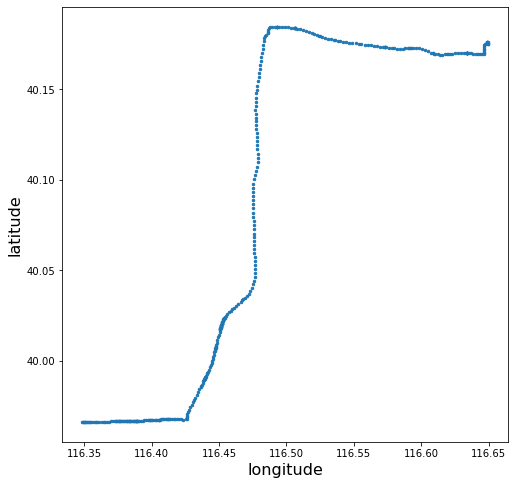

In [18]:
fig = plt.figure(figsize=(8,8))
plt.scatter(lon_lat_arr[:,0]*1e-3, lon_lat_arr[:,1]*1e-3, s=6)
plt.xlabel('longitude',fontsize=16)
plt.ylabel('latitude', fontsize=16)

In [19]:
print (len(lon_lat_arr))

388


28


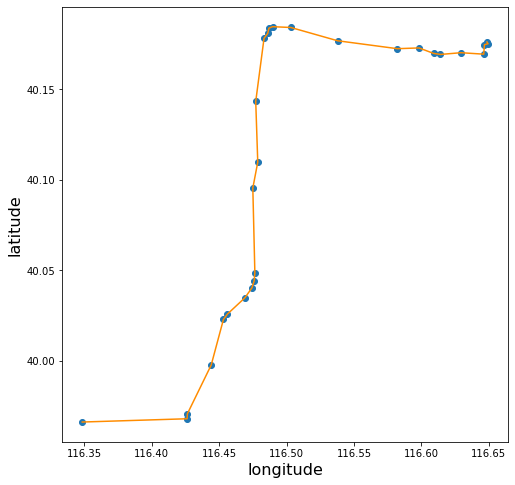

In [20]:
traj_rdp = rdp(df_slice[['lng_p','lat_p']], epsilon=0.5) # 约50m范围内
lon_lat_arr = np.array(traj_rdp)
fig = plt.figure(figsize=(8,8))
plt.scatter(lon_lat_arr[:,0]*1e-3, lon_lat_arr[:,1]*1e-3)
plt.plot(lon_lat_arr[:,0]*1e-3, lon_lat_arr[:,1]*1e-3, color='darkorange')
plt.xlabel('longitude',fontsize=16)
plt.ylabel('latitude', fontsize=16)
print (len(lon_lat_arr))

In [8]:
from rdp import rdp
df_slice = data_driving[data_driving['traj_id']==1]
lon_lat_arr_ori = np.array(df_slice[['lng_p','lat_p']])
# plt.plot(lon_lat_arr_ori[:,0], lon_lat_arr_ori[:,1])
# print (len(lon_lat_arr_ori))
traj_rdp = rdp(df_slice[['lng_p','lat_p']], epsilon=0.5) # 约50m范围内
lon_lat = np.array(traj_rdp)
# plt.plot(lon_lat[:,0], lon_lat[:,1])
# print (len(lon_lat))
s = 10289
for j in range(2,s):
#     fig = plt.figure(figsize=(20,10))
    df_slice = data_driving[data_driving['traj_id']==j]
    print (j)
#     lon_lat_arr_ori = np.array(df_slice[['lng_p','lat_p']])
#     plt.plot(lon_lat_arr_ori[:,0], lon_lat_arr_ori[:,1])
#     print (len(lon_lat_arr_ori))
    traj_rdp = rdp(df_slice[['lng_p','lat_p']], epsilon=0.5) # 约50m范围内
    lon_lat_arr = np.array(traj_rdp)
#         plt.plot(lon_lat_arr[:,0], lon_lat_arr[:,1])
#         print (len(lon_lat_arr))
    lon_lat = np.concatenate((lon_lat, lon_lat_arr), axis=0)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
27

1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064


3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711


5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352


6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997


8441
8442
8443
8444
8445
8446
8447
8448
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640


10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
10096
10097
10098
10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
10165
10166
10167
10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
10216
10217
10218
10219
10220
10221
10222
10223
10224
10225
10226
10227
10228
10229
10230
10231
10232
10233
10234
10235
10236
10237
10238
10239
10240
10241
10242
1024

In [9]:
import pickle
print (lon_lat.shape)
with open(r'C:\competition\www\lon_lat.pkl', 'wb') as f:
    pickle.dump(lon_lat, f)

(148903, 2)


In [ ]:
# 轨迹抽稀效果图

In [ ]:
# 数据量变化

# 提取非零轨迹点数据，DBSCAN聚类

In [47]:
file = open(r'C:\competition\www\lon_lat.pkl', 'rb')
lon_lat = pickle.load(file)

In [48]:
lon_lat

array([[116348.615,  39966.315],
       [116426.311,  39968.12 ],
       [116426.524,  39970.832],
       ...,
       [116300.323,  38958.375],
       [116297.093,  38960.005],
       [116297.134,  38960.953]])

In [28]:
from sklearn.cluster import DBSCAN as dbscan
from math import radians, cos, sin, asin, sqrt

lon_lat_df = pd.DataFrame(lon_lat)
lon_lat_df.columns = ['lon','lat']
len(lon_lat_df)

148903

In [30]:
lon_lat_df['lon_normal'] = lon_lat_df['lon']*0.001
lon_lat_df['lat_normal'] = lon_lat_df['lat']*0.001
lon_lat_df['lon1'] = lon_lat_df['lon_normal'].apply(radians)
lon_lat_df['lat1'] = lon_lat_df['lat_normal'].apply(radians)
lon_lat_df

,lon,lat,lon_normal,lat_normal,lon1,lat1
0,116348.615,39966.315,116.348615,39.966315,2.030666,0.697544
1,116426.311,39968.120,116.426311,39.968120,2.032022,0.697575
2,116426.524,39970.832,116.426524,39.970832,2.032026,0.697623
3,116444.184,39997.783,116.444184,39.997783,2.032334,0.698093
4,116453.245,40022.915,116.453245,40.022915,2.032493,0.698532
...,...,...,...,...,...,...
148898,116320.220,38950.635,116.320220,38.950635,2.030171,0.679817
148899,116317.480,38952.292,116.317480,38.952292,2.030123,0.679846
148900,116300.323,38958.375,116.300323,38.958375,2.029824,0.679952
148901,116297.093,38960.005,116.297093,38.960005,2.029767,0.679980


In [31]:
from sklearn.clustering import KMeans
def haversine(data1, data2): # 经度1，纬度1，经度2，纬度2 （十进制度数）
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # 将十进制度数转化为弧度    
    lon1 = data1[0]
    lat1 = data1[1]
    lon2 = data2[0]
    lat2 = data2[1]
    
#     lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
 
    # haversine公式
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6378.137 # 地球平均半径，单位为公里
    return c * r * 1000
 
clustering = dbscan(eps=500,min_samples=5, metric=lambda a, b: haversine(a,b)).fit(lon_lat_df[['lon1','lat1']])
#eps直接变为显示距离，单位为米。

In [32]:
labels = np.array(clustering.labels_)
labels.min(), labels.max()

(-1, 244)

In [34]:
label_df = pd.DataFrame(labels)
label_df.columns=['label']
label_df

,label
0,0
1,0
2,0
3,0
4,0
...,...
148898,241
148899,241
148900,242
148901,242


In [35]:
lon_lat_label = lon_lat_df.join(label_df)
lon_lat_label

,lon,lat,lon_normal,lat_normal,lon1,lat1,label
0,116348.615,39966.315,116.348615,39.966315,2.030666,0.697544,0
1,116426.311,39968.120,116.426311,39.968120,2.032022,0.697575,0
2,116426.524,39970.832,116.426524,39.970832,2.032026,0.697623,0
3,116444.184,39997.783,116.444184,39.997783,2.032334,0.698093,0
4,116453.245,40022.915,116.453245,40.022915,2.032493,0.698532,0
...,...,...,...,...,...,...,...
148898,116320.220,38950.635,116.320220,38.950635,2.030171,0.679817,241
148899,116317.480,38952.292,116.317480,38.952292,2.030123,0.679846,241
148900,116300.323,38958.375,116.300323,38.958375,2.029824,0.679952,242
148901,116297.093,38960.005,116.297093,38.960005,2.029767,0.679980,242


In [36]:
lon_lat_label[lon_lat_label['label']==-1]

,lon,lat,lon_normal,lat_normal,lon1,lat1,label
12,116477.186,40143.285,116.477186,40.143285,2.032910,0.700632,-1
17,116503.189,40184.107,116.503189,40.184107,2.033364,0.701345,-1
18,116537.894,40176.776,116.537894,40.176776,2.033970,0.701217,-1
19,116582.128,40172.408,116.582128,40.172408,2.034742,0.701141,-1
20,116598.183,40172.811,116.598183,40.172811,2.035022,0.701148,-1
...,...,...,...,...,...,...,...
148886,116370.960,38962.561,116.370960,38.962561,2.031056,0.680025,-1
148887,116359.231,38953.629,116.359231,38.953629,2.030852,0.679869,-1
148888,116348.017,38947.685,116.348017,38.947685,2.030656,0.679765,-1
148889,116347.434,38947.574,116.347434,38.947574,2.030646,0.679763,-1


In [46]:
lon_lat_label.to_csv(r'C:\competition\www\lon_lat_label.csv', index=False)

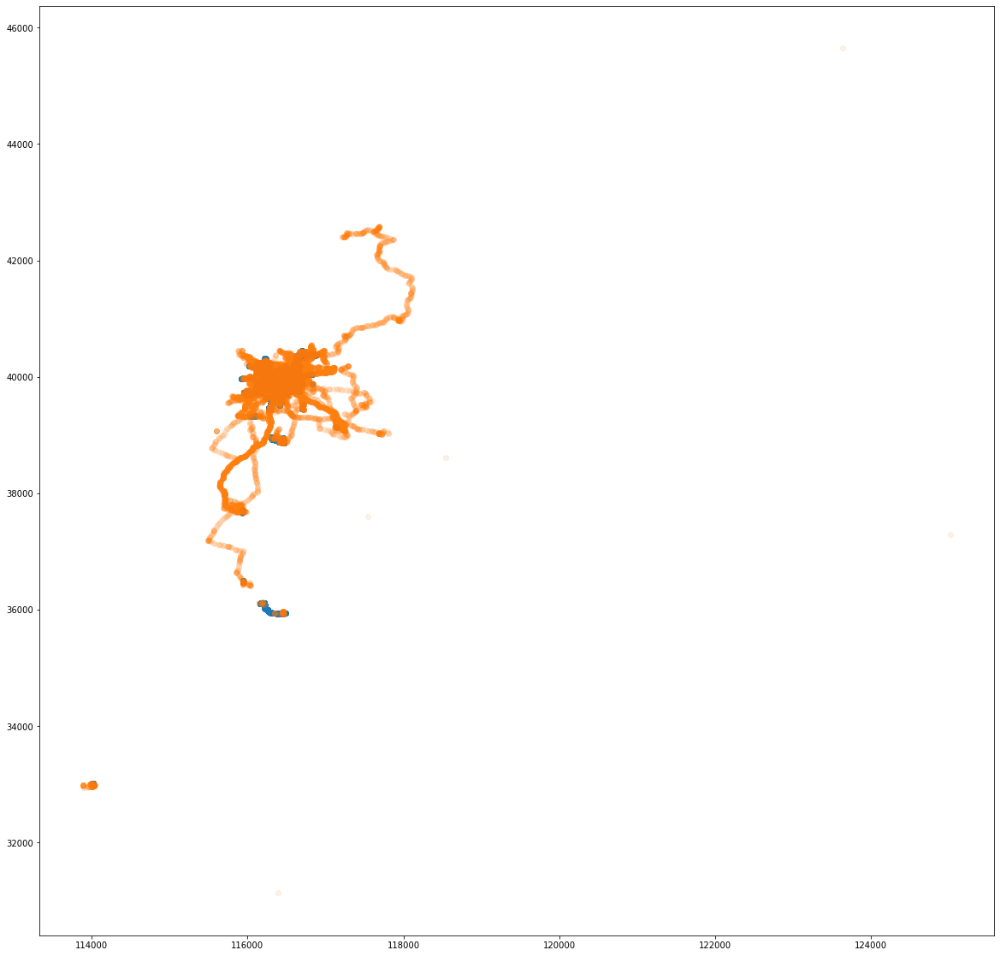

In [44]:
fig = plt.figure(figsize=(20,20))
plt.scatter(lon_lat_label[lon_lat_label['label']!=-1]['lon'], lon_lat_label[lon_lat_label['label']!=-1]['lat'], alpha=0.1)
plt.scatter(lon_lat_label[lon_lat_label['label']==-1]['lon'], lon_lat_label[lon_lat_label['label']==-1]['lat'], alpha=0.1)

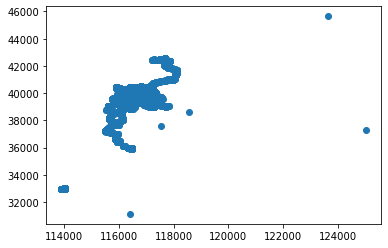

In [43]:
plt.scatter(lon_lat_label[lon_lat_label['label']==-1]['lon'], lon_lat_label[lon_lat_label['label']==-1]['lat'])